# Part 3 of Amini Cocoa Contamination Challenge Solution By SPECIALZ🔥🔥🙌🏽 

## 📈 Explainability

### Install Necessary Packages

In [1]:
!pip -q install -U ultralytics

In [2]:
!pip install -q torchcam

### Import Necessary Packages

In [3]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from pathlib import Path
import cv2
from pathlib import Path
import random
import os
import pandas as pd
from ultralytics import YOLO

In [4]:
# Set the data directory
DATA_DIR = Path('/kaggle/input/amini-cocoa-contamination-challenge/')
IMGS_DIR = Path('/kaggle/input/amini-cocoa-contamination-challenge/dataset/images')

# Load train and test files
train = pd.read_csv(DATA_DIR / 'Train.csv')
test = pd.read_csv(DATA_DIR / 'Test.csv')
ss = pd.read_csv(DATA_DIR / 'SampleSubmission.csv')

In [5]:
class_names = train['class'].unique().tolist()

### 📁  Set configurations and seed

In [6]:
N_SPLITS = 5
RANDOM_STATE = 42
FOLD=0

def fix_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False

fix_seed(RANDOM_STATE)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### 📁 Directory and Data Loading

In [7]:
DIR_DATA = '/kaggle/input/amini-cocoa-contamination-challenge'
df_test = pd.read_csv(f'{DIR_DATA}/Test.csv')
df_test['path'] = f'{DIR_DATA}/dataset/images/test/'+df_test.Image_ID
df_test.shape

(1626, 10)

In [8]:
assert len(df_test) == df_test.Image_ID.nunique()

In [9]:
# Reload the model to ensure a clean state
model1 = YOLO('/kaggle/input/amini-cocoa-0.821-model/pytorch/default/1/best.pt')

In [10]:
# Reload the model to ensure a clean state
model2 = YOLO('/kaggle/input/yolo11l-weighteddataset-640imgsz-100epochs/pytorch/default/1/yolo11_balanced_best.pt')

In [11]:
# Clear any existing hooks from the model
def clear_model_hooks(model):
    """
    Safely clear forward and backward hooks from the model.
    """
    for module in model.model.modules():
        forward_hooks = list(getattr(module, '_forward_hooks', {}).keys())
        for hook_id in forward_hooks:
            module._forward_hooks.pop(hook_id)
        backward_hooks = list(getattr(module, '_backward_hooks', {}).keys())
        for hook_id in backward_hooks:
            module._backward_hooks.pop(hook_id)

try:
    clear_model_hooks(model)
except Exception as e:
    print(f"Error clearing hooks: {e}")
    print("Proceeding with reloaded model, which should be clean.")

class ManualGradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self.register_hooks()
    
    def save_gradients(self, grad):
        self.gradients = grad
    
    def register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        
        try:
            target_module = dict(self.model.named_modules())[self.target_layer]
            self.hook_handles.append(target_module.register_forward_hook(forward_hook))
            self.hook_handles.append(target_module.register_backward_hook(backward_hook))
        except KeyError:
            raise ValueError(f"Target layer {self.target_layer} not found in model")
    
    def __call__(self, input_tensor, class_idx):
        self.model.zero_grad()
        for param in self.model.parameters():
            param.requires_grad_(True)
        
        try:
            # Forward pass
            output = self.model(input_tensor)
            # Check if output is a Results object or raw tensor
            if isinstance(output, (list, tuple)) and hasattr(output[0], 'boxes'):
                cls_scores = output[0].boxes.cls
            else:
                # Assume raw tensor output (e.g., [batch, num_boxes, num_classes + 4])
                cls_scores = output[0][:, 4:]  # Extract class scores, assuming [x, y, w, h, cls_scores]
            
            if cls_scores.shape[0] == 0:
                print("No detections in Grad-CAM forward pass")
                return None
            
            # Target the class score
            target = cls_scores[:, class_idx].sum()
            
            # Backward pass
            target.backward()
            
            # Compute Grad-CAM
            if self.gradients is None or self.activations is None:
                print("Gradients or activations not captured")
                return None
            weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
            cam = torch.sum(weights * self.activations, dim=1)
            cam = torch.relu(cam)
            return cam
        except Exception as e:
            print(f"Error in Grad-CAM computation: {e}")
            return None
        finally:
            for param in self.model.parameters():
                param.requires_grad_(False)
    
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

def generate_gradcam(image_path, model, class_names, target_layer='model.23.cv2.0.0.conv', output_dir='./gradcam_outputs'):
    """
    Generate and save Grad-CAM heatmap for a given image using manual implementation.
    Args:
        image_path: Path to input image
        model: YOLO model
        class_names: List of class names
        target_layer: Target convolutional layer for Grad-CAM
        output_dir: Directory to save visualizations
    """
    # Create output directory
    Path(output_dir).mkdir(parents=True, exist_ok=True)
    
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img)
    # Standardize input size to match model expectations (e.g 576x576 Image sizes)
    input_size = (576, 576)  
    img_resized = cv2.resize(img_np, input_size)
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float().div(255.0).unsqueeze(0).to(device)
    img_tensor.requires_grad_(True)
    
    # Run inference to get predictions
    try:
        with torch.no_grad():
            results = model(image_path)
    except Exception as e:
        print(f"Error during inference for {image_path}: {e}")
        return
    
    # Get predictions (bounding boxes and class scores)
    pred = results[0].boxes
    if len(pred) == 0:
        print(f"No detections for {image_path}")
        return
    
    # Initialize manual Grad-CAM
    try:
        gradcam = ManualGradCAM(model.model, target_layer)
    except ValueError as e:
        print(f"Error initializing Grad-CAM: {e}")
        return
    
    # For each detected object, generate Grad-CAM
    for i, (box, cls, conf) in enumerate(zip(pred.xyxy, pred.cls, pred.conf)):
        if conf < 0.5:  # Skip low-confidence detections
            continue
            
        cls_idx = int(cls.item())
        cls_name = class_names[cls_idx]
        
        # Compute Grad-CAM
        try:
            cam = gradcam(img_tensor, cls_idx)
            if cam is None:
                print(f"Grad-CAM failed for {cls_name} in {image_path}")
                continue
        except Exception as e:
            print(f"Grad-CAM error for {cls_name} in {image_path}: {e}")
            continue
        
        # Convert CAM to heatmap
        cam = cam[0].cpu().numpy()
        cam = cv2.resize(cam, (img_np.shape[1], img_np.shape[0]))
        cam = np.uint8(255 * (cam - cam.min()) / (cam.max() - cam.min() + 1e-8))
        heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
        
        # Overlay heatmap on original image
        superimposed_img = heatmap * 0.4 + img_np
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
        
        # Draw bounding box on the image
        x1, y1, x2, y2 = map(int, box.cpu().numpy())
        cv2.rectangle(superimposed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(superimposed_img, f"{cls_name}: {conf:.2f}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
        
        # Save the visualization
        output_path = Path(output_dir) / f"{Path(image_path).stem}_gradcam_{cls_name}_{i}.jpg"
        cv2.imwrite(str(output_path), superimposed_img)
        
        # Display the result
        plt.figure(figsize=(10, 10))
        plt.imshow(superimposed_img[:, :, ::-1])  # Convert BGR to RGB
        plt.title(f"Grad-CAM: {cls_name} (Conf: {conf:.2f})")
        plt.axis('off')
        plt.show()
    
    # Clean up
    gradcam.remove_hooks()

Error clearing hooks: name 'model' is not defined
Proceeding with reloaded model, which should be clean.


### Explainability of Model1

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_MNV5lc.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_MNV5lc.jpg: 640x480 1 cssvd, 67.4ms
Speed: 2.2ms preprocess, 67.4ms inference, 194.3ms postprocess per image at shape (1, 3, 640, 480)


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


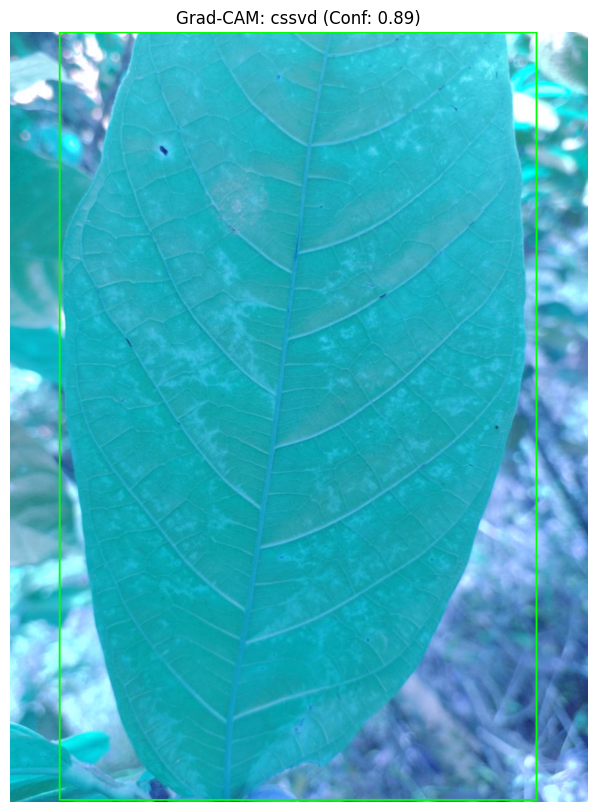

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_PQ3ccq.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_PQ3ccq.jpg: 480x640 1 cssvd, 56.5ms
Speed: 2.5ms preprocess, 56.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


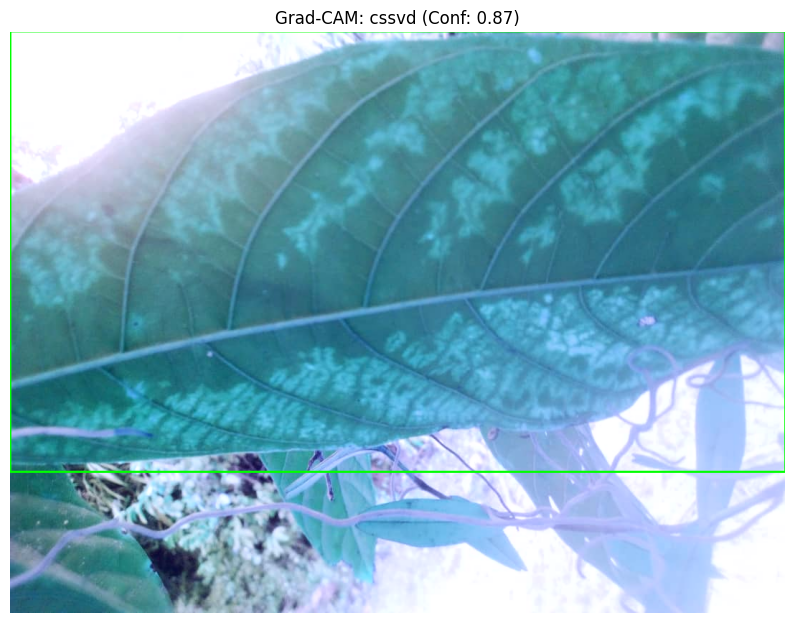

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_cF0WSr.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_cF0WSr.jpg: 640x480 2 cssvds, 26.7ms
Speed: 2.8ms preprocess, 26.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)
Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_gxJl1S.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_gxJl1S.jpg: 640x640 3 healthys, 34.8ms
Speed: 2.1ms preprocess, 34.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


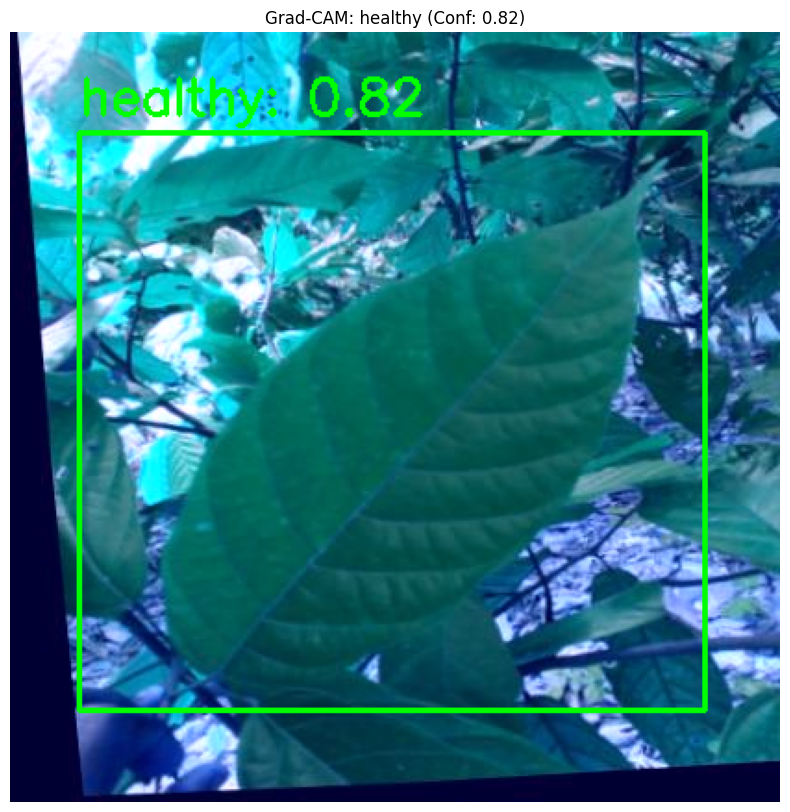

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_d0hoEZ.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_d0hoEZ.jpg: 640x640 2 healthys, 24.0ms
Speed: 2.5ms preprocess, 24.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


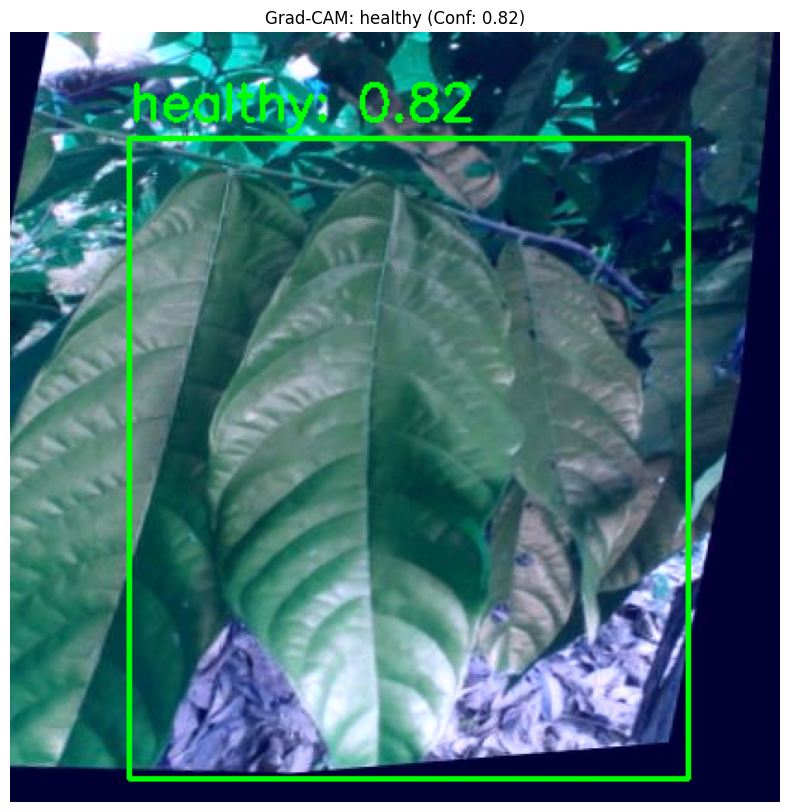

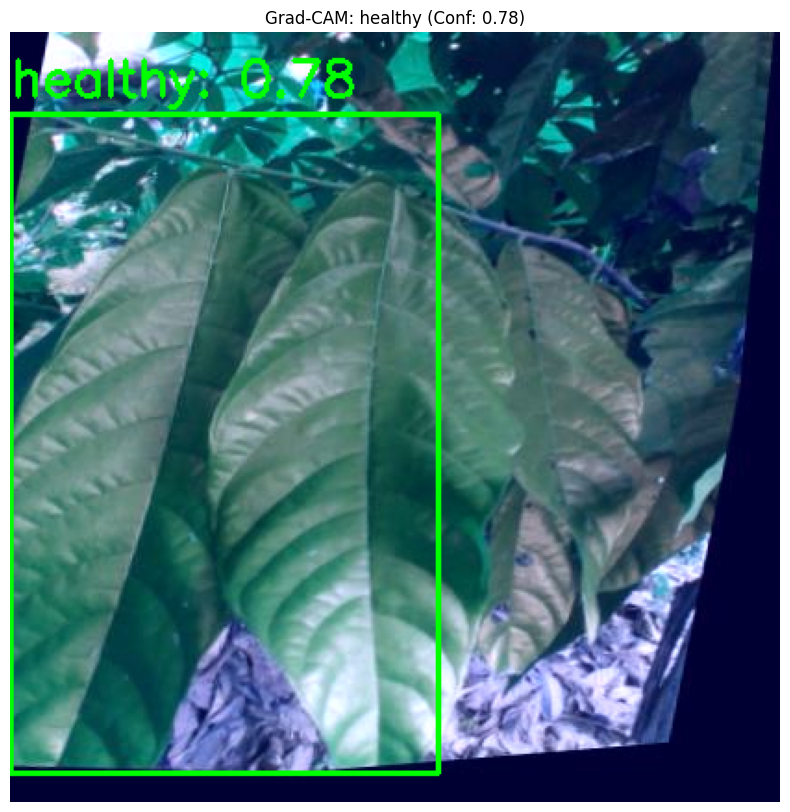

In [12]:
TEST_IMAGES_DIR = Path('/kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test')
# Select a subset of validation images for explainability
val_images = list(TEST_IMAGES_DIR.glob('*.jpg'))[:5]
for img_path in val_images:
    print(f"Generating Grad-CAM for {img_path}")
    generate_gradcam(img_path, model1, class_names, target_layer='model.23.cv2.0.0.conv', output_dir='./gradcam_outputs')

### Explainability of Model2

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_MNV5lc.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_MNV5lc.jpg: 640x480 1 cssvd, 18.8ms
Speed: 1.9ms preprocess, 18.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


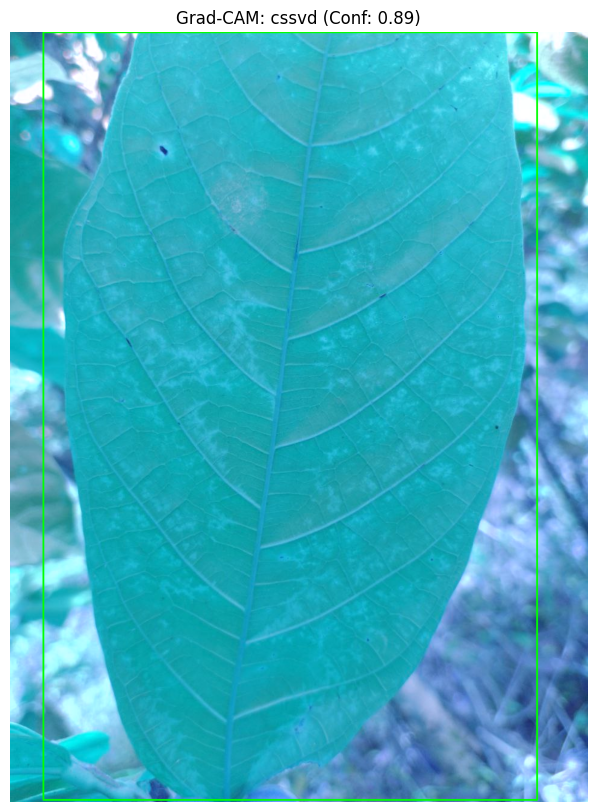

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_PQ3ccq.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_PQ3ccq.jpg: 480x640 1 cssvd, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


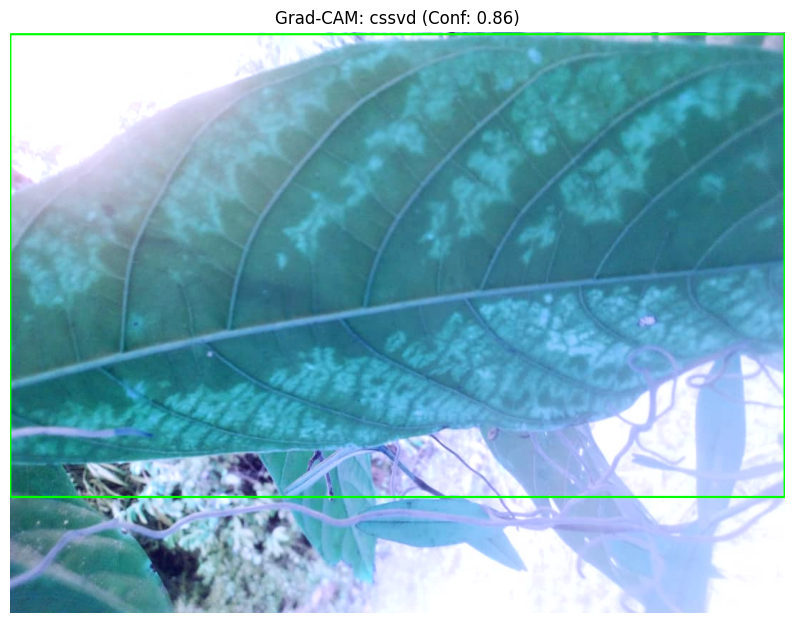

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_cF0WSr.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_cF0WSr.jpg: 640x480 2 cssvds, 18.3ms
Speed: 2.3ms preprocess, 18.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


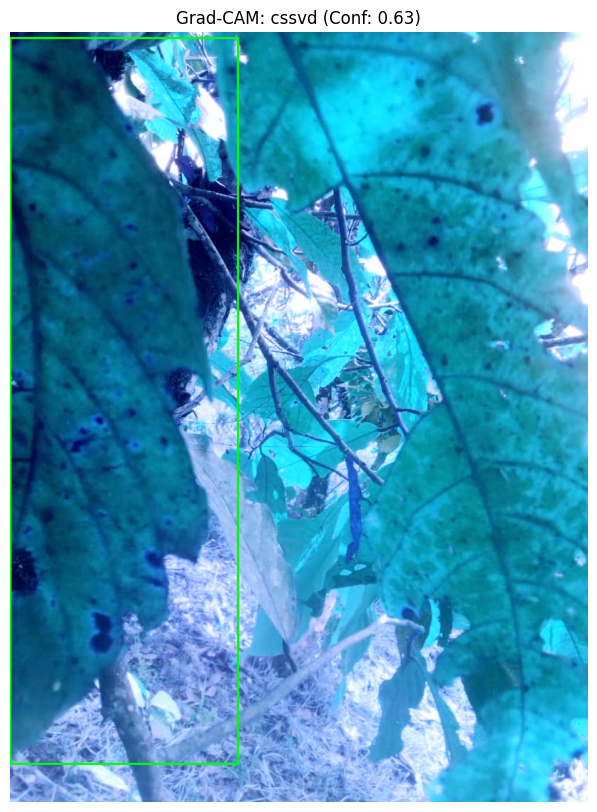

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_gxJl1S.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_gxJl1S.jpg: 640x640 4 healthys, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


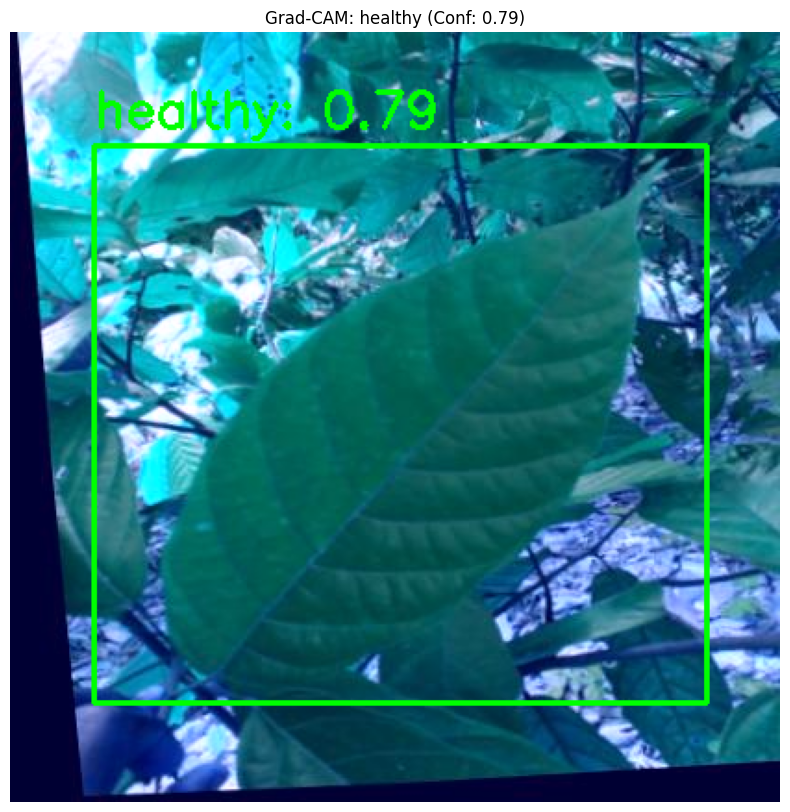

Generating Grad-CAM for /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_d0hoEZ.jpg

image 1/1 /kaggle/input/amini-cocoa-contamination-challenge/dataset/images/test/ID_d0hoEZ.jpg: 640x640 3 healthys, 22.8ms
Speed: 3.2ms preprocess, 22.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


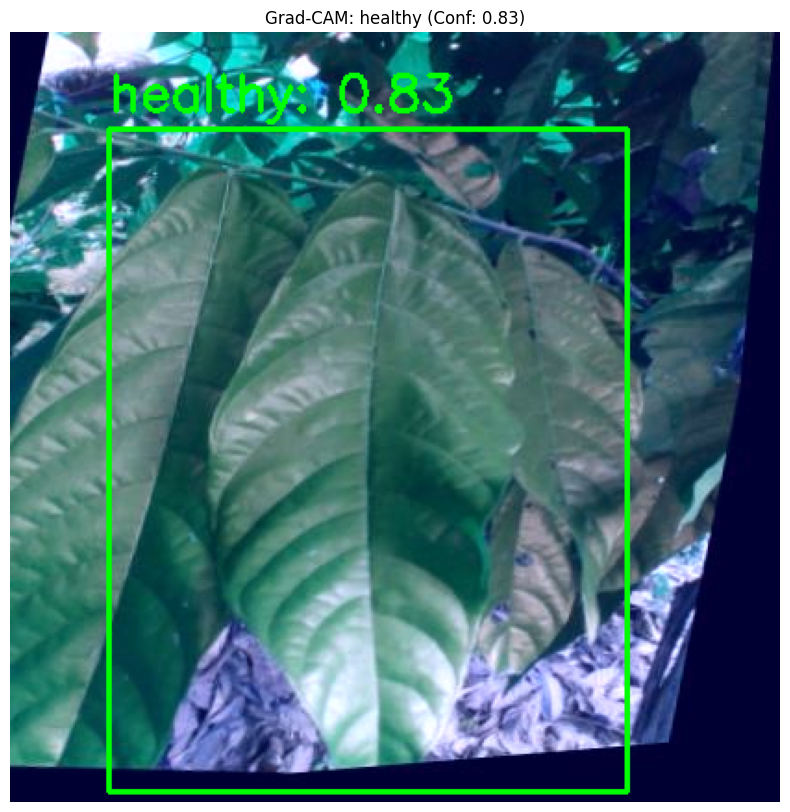

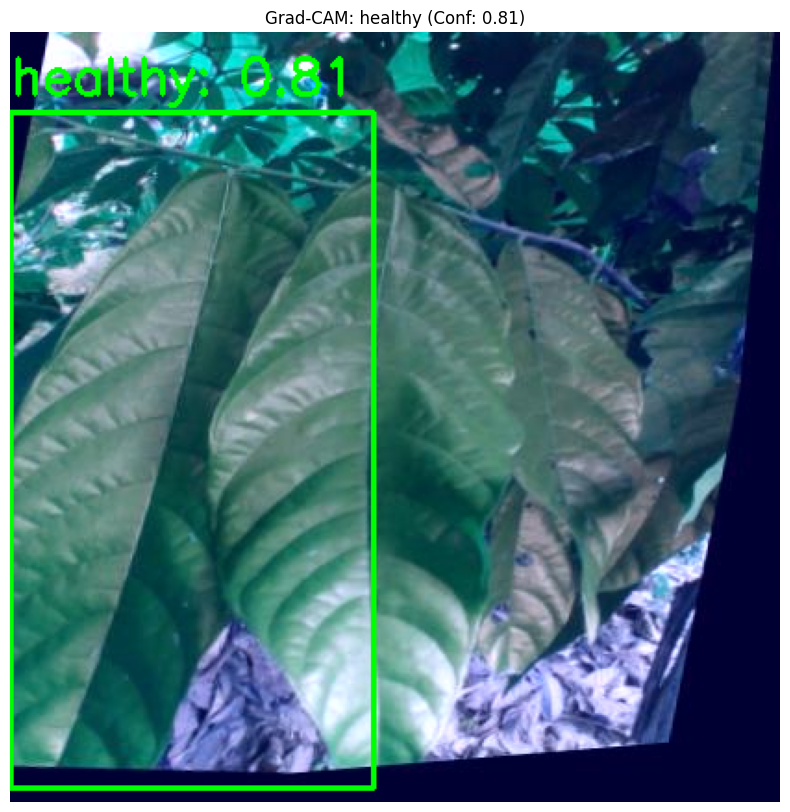

In [13]:
for img_path in val_images:
    print(f"Generating Grad-CAM for {img_path}")
    generate_gradcam(img_path, model2, class_names, target_layer='model.23.cv2.0.0.conv', output_dir='./gradcam_outputs')

### And Don't Just Have A Good Day, Have A Great Day!
## Thank You!